# Import library

In [32]:
import os
import time
import opensilexClientToolsPython as osC
import pandas as pd
import sys
import datetime
from lxml import etree as ET
import json
import yaml
from tqdm import tqdm
import math
print("Library Imported")

Library Imported


# Set Working Directory

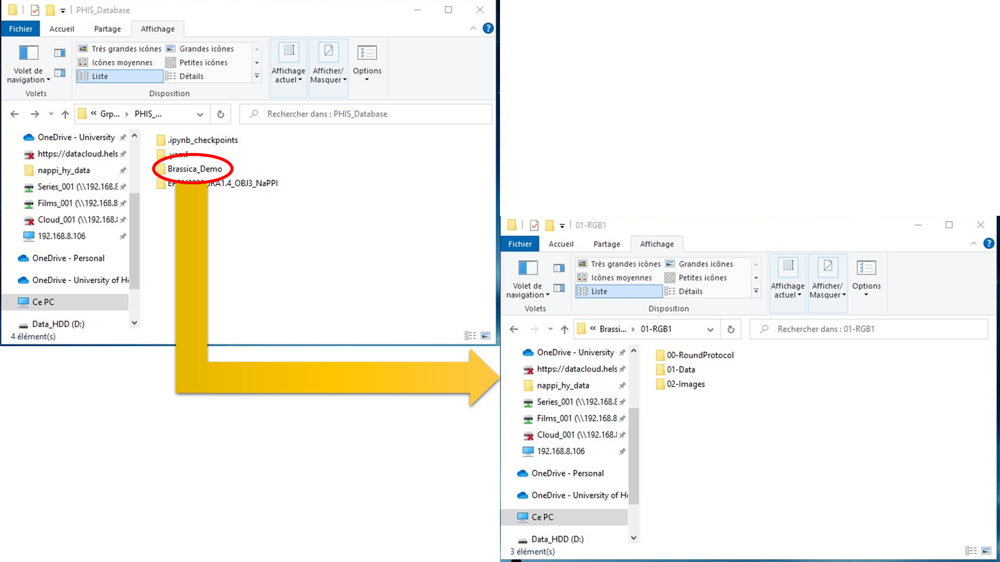

In [81]:
exp_name='Brassica_Demo'

### Set database wd ###############################################################################
wd = os.path.normpath(r"P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database")
os.chdir(wd)

wd_exp=os.path.join(wd, exp_name)
wd_rgb1=os.path.join(wd_exp, '01-RGB1')
wd_rgb1_roundinfo = os.path.join(wd_rgb1, '00-RoundProtocol')

print('Experiment Directory: {}\nRGB1 Directory: {}\nRGB1 Round Protocol Directory: {}'.format(wd_exp, wd_rgb1,wd_rgb1_roundinfo))

Experiment Directory: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\Brassica_Demo
RGB1 Directory: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\Brassica_Demo\01-RGB1
RGB1 Round Protocol Directory: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\Brassica_Demo\01-RGB1\00-RoundProtocol


# Connection to PHIS Instance

In [101]:
## Get Login Info #################################################################################
wd_yaml=os.path.join(wd, '.yaml')
with open (os.path.join(wd_yaml, '01-login.yaml'), 'r') as stream:
    login=yaml.safe_load(stream)
del(wd_yaml)

### Connect to PHIS Database ######################################################################
Py_Client = osC.ApiClient()
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
#print(Py_Client.default_headers['Authorization'])
if Py_Client.default_headers:
    print(f"Connected at {time.strftime('%Y-%m-%d %H:%M:%S')}")

Connected at 2023-12-07 17:50:32


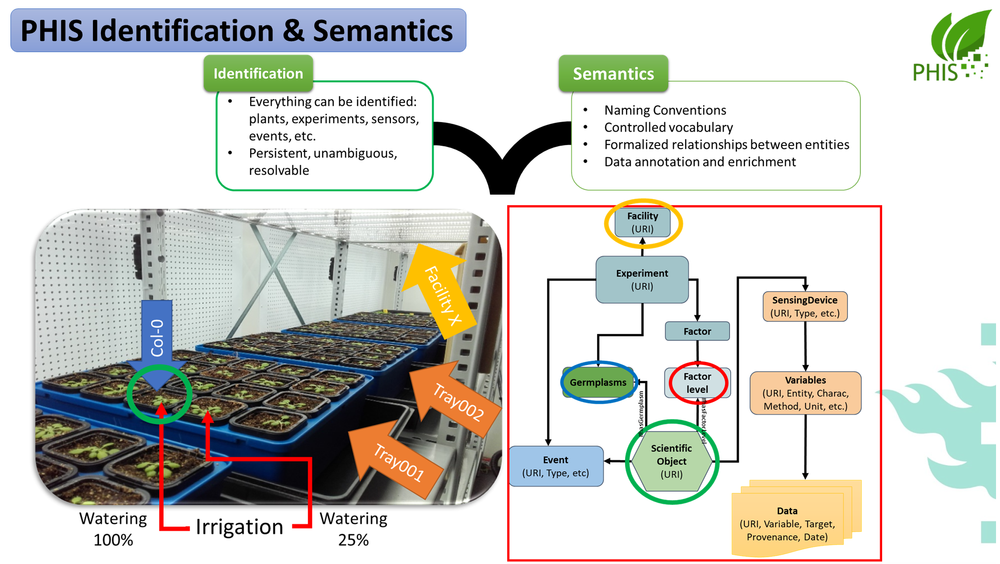

# Get Experiment URI

In [35]:
Exp_Api = osC.ExperimentsApi(Py_Client)
Exp_Src = Exp_Api.search_experiments(name=exp_name)["result"]

print(Exp_Src)
print('\n')
print('#'*90)
print('\n')

uri_exp = Exp_Src[0].uri
start_date = Exp_Src[0].start_date
end_date = Exp_Src[0].end_date
uri_facility = Exp_Src[0].facilities
Facility='Modular'

print(f'Exp URI: {uri_exp}\nExp Start Date: {start_date}\nExp End Date: {end_date}\nExp Facility URI: {uri_facility[0]}\n')

[{'description': 'Demo dataset from side-view images of B. rapa segregating '
                'population',
 'end_date': '2018-10-02',
 'facilities': ['phis-egi-demo:id/organization/facility.plantscreen_modular_system'],
 'is_public': False,
 'name': 'Brassica_Demo',
 'objective': 'HTP phenotyping of a segregating population of B. rapa for gene '
              'Bhz1.',
 'species': ['http://aims.fao.org/aos/agrovoc/c_1066'],
 'start_date': '2018-08-21',
 'uri': 'phis-egi-demo:id/experiment/brassica_demo'}]


##########################################################################################


Exp URI: phis-egi-demo:id/experiment/brassica_demo
Exp Start Date: 2018-08-21
Exp End Date: 2018-10-02
Exp Facility URI: phis-egi-demo:id/organization/facility.plantscreen_modular_system



# Load Data

## RGB1 Morpho Data

In [83]:
df_rgb1 = pd.read_excel(os.path.join(wd_rgb1, '01-Data','RGB1_Morpho_Manual.xlsx'))
df_rgb1['Measuring Date'] = df_rgb1['Measuring Date'].dt.date
PID = df_rgb1['PID'].unique()[0]
df_rgb1.head()

,Measuring Date,Experiment ID,Round Order,Tray ID,Plant ID,Geno,Germplasm,DAG,Type,Obs,PID,Position,AREA_MM,PERIMETER_MM,COMPACTNESS,WIDTH_MM,HEIGHT_MM
0,2018-08-21,69,4,180806.Bra.37,BRA04_037,SemiDwarf,BC4F2_4003_SemiDwarf,10,Seg,Ok,RGB1,A1,123,123,123,123,123
1,2018-08-21,69,4,180806.Bra.49,BRA04_049,WildType,BC4F2_4003_WildType,10,Seg,Ok,RGB1,A1,123,123,123,123,123
2,2018-08-21,69,4,180806.Bra.67,BRA04_067,Dwarf,BC4F2_4003_Dwarf,10,Seg,Ok,RGB1,A1,123,123,123,123,123
3,2018-08-23,69,6,180806.Bra.37,BRA04_037,SemiDwarf,BC4F2_4003_SemiDwarf,12,Seg,Ok,RGB1,A1,123,123,123,123,123
4,2018-08-23,69,6,180806.Bra.49,BRA04_049,WildType,BC4F2_4003_WildType,12,Seg,Ok,RGB1,A1,123,123,123,123,123


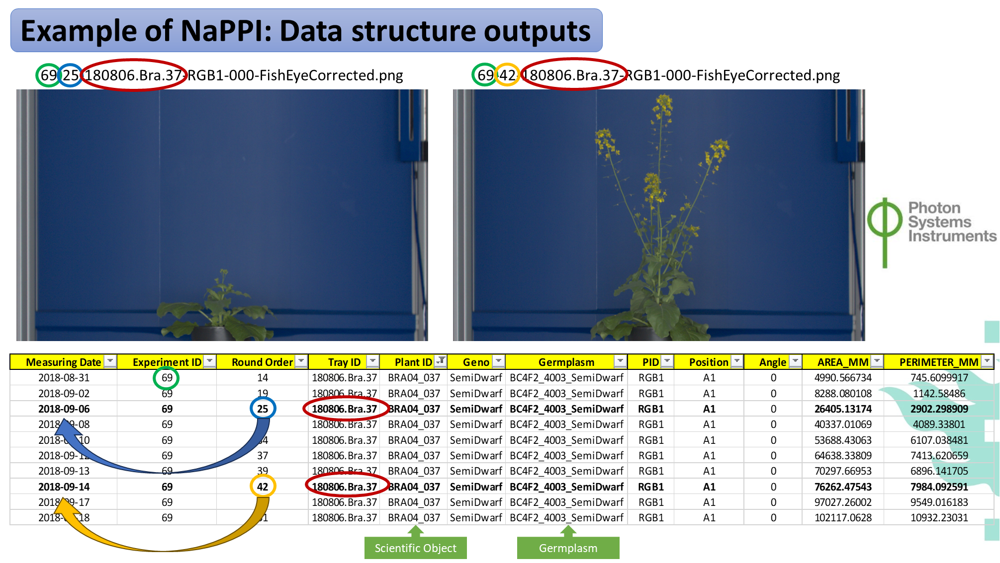

# Get Generic Info

## Recover Scientific Object Name&Info

In [37]:
df_ScObj = df_rgb1.loc[:, "Tray ID":"Germplasm"].drop_duplicates().dropna()
Germplasm=df_ScObj['Germplasm'].tolist()
df_ScObj.head()

,Tray ID,Plant ID,Geno,Germplasm
0,180806.Bra.37,BRA04_037,SemiDwarf,BC4F2_4003_SemiDwarf
1,180806.Bra.49,BRA04_049,WildType,BC4F2_4003_WildType
2,180806.Bra.67,BRA04_067,Dwarf,BC4F2_4003_Dwarf


## Get links between Round and Date

In [85]:
#%% Get Round Info in Dict ########################################################################
Date_Round={}
Tray_Plant={}
for index, row in df_rgb1.iterrows():
    Date_Round.update({row["Round Order"]: row['Measuring Date']})
    Tray_Plant.update({row["Tray ID"]: row['Plant ID']})
del index, row
print('Done')

Done


In [95]:
Date_Round

{4: datetime.date(2018, 8, 21),
 6: datetime.date(2018, 8, 23),
 8: datetime.date(2018, 8, 25),
 10: datetime.date(2018, 8, 27),
 14: datetime.date(2018, 8, 31),
 19: datetime.date(2018, 9, 2),
 25: datetime.date(2018, 9, 6),
 31: datetime.date(2018, 9, 8),
 34: datetime.date(2018, 9, 10),
 37: datetime.date(2018, 9, 12),
 39: datetime.date(2018, 9, 13),
 42: datetime.date(2018, 9, 14),
 48: datetime.date(2018, 9, 17),
 51: datetime.date(2018, 9, 18),
 53: datetime.date(2018, 9, 19),
 55: datetime.date(2018, 9, 20),
 58: datetime.date(2018, 9, 21),
 60: datetime.date(2018, 9, 22),
 62: datetime.date(2018, 9, 23),
 65: datetime.date(2018, 9, 24),
 68: datetime.date(2018, 9, 25),
 70: datetime.date(2018, 9, 26),
 72: datetime.date(2018, 9, 27),
 75: datetime.date(2018, 9, 28),
 79: datetime.date(2018, 9, 29),
 81: datetime.date(2018, 9, 30),
 83: datetime.date(2018, 10, 1),
 85: datetime.date(2018, 10, 2)}

## Create Generic Relation

In [40]:
### Get or Create Scientific Objects Name&URI #####################################################
Relations_Gen = []

# Get Facility Name&URI ###########################################################################
if not uri_facility:
    print("Facility Missing")
else:
    for facility in uri_facility:
        # ObjectRealtionDTO for Facility ##########################################################
        relation_temp = osC.RDFObjectRelationDTO(
            _property="vocabulary:isHosted",
            value=facility)
        Relations_Gen.append(relation_temp)
        del relation_temp

# ObjectRealtionDTO for Start Date ################################################################
relation_temp = osC.RDFObjectRelationDTO(
    _property="vocabulary:hasCreationDate",
    value=start_date)
Relations_Gen.append(relation_temp)

# ObjectRealtionDTO for End Date ##################################################################
relation_temp = osC.RDFObjectRelationDTO(
    _property="vocabulary:hasDestructionDate",
    value=end_date)
Relations_Gen.append(relation_temp)

print('Done')

Done


In [41]:
for elts in Relations_Gen:
    print('#'*100)
    print(elts)

####################################################################################################
{'_property': 'vocabulary:isHosted',
 'inverse': None,
 'value': 'phis-egi-demo:id/organization/facility.plantscreen_modular_system'}
####################################################################################################
{'_property': 'vocabulary:hasCreationDate',
 'inverse': None,
 'value': '2018-08-21'}
####################################################################################################
{'_property': 'vocabulary:hasDestructionDate',
 'inverse': None,
 'value': '2018-10-02'}


## Get Germplasm and Factor URI

In [96]:
df_ScObj

,Tray ID,Plant ID,Geno,Germplasm
0,180806.Bra.37,BRA04_037,SemiDwarf,BC4F2_4003_SemiDwarf
1,180806.Bra.49,BRA04_049,WildType,BC4F2_4003_WildType
2,180806.Bra.67,BRA04_067,Dwarf,BC4F2_4003_Dwarf


In [43]:
Germplasm=df_ScObj['Germplasm'].tolist()

# Germplasm Info #################################################################################
Germ_Api = osC.GermplasmApi(Py_Client)
Subtaxa_uri={}

if not Germplasm:
    print("Germplasm Missing")
else:
    for elts in Germplasm:
        Germ_Src = Germ_Api.search_germplasm(name=elts)["result"]
        Subtaxa_uri.update({Germ_Src[0].name: Germ_Src[0].uri})

# Factors Info ###################################################################################
Factors_Levels_uri={}
#Not used in this dataset

# RDF Type Info ##################################################################################
rdf_type='vocabulary:Plant'

print('Done')

Done


In [45]:
Subtaxa_uri

{'BC4F2_4003_SemiDwarf': 'http://phis.egi-demo.eu/id/germplasm/variety.bc4f2_4003_semidwarf',
 'BC4F2_4003_WildType': 'http://phis.egi-demo.eu/id/germplasm/variety.bc4f2_4003_wildtype',
 'BC4F2_4003_Dwarf': 'http://phis.egi-demo.eu/id/germplasm/variety.bc4f2_4003_dwarf'}

## Get Round Protocol Info

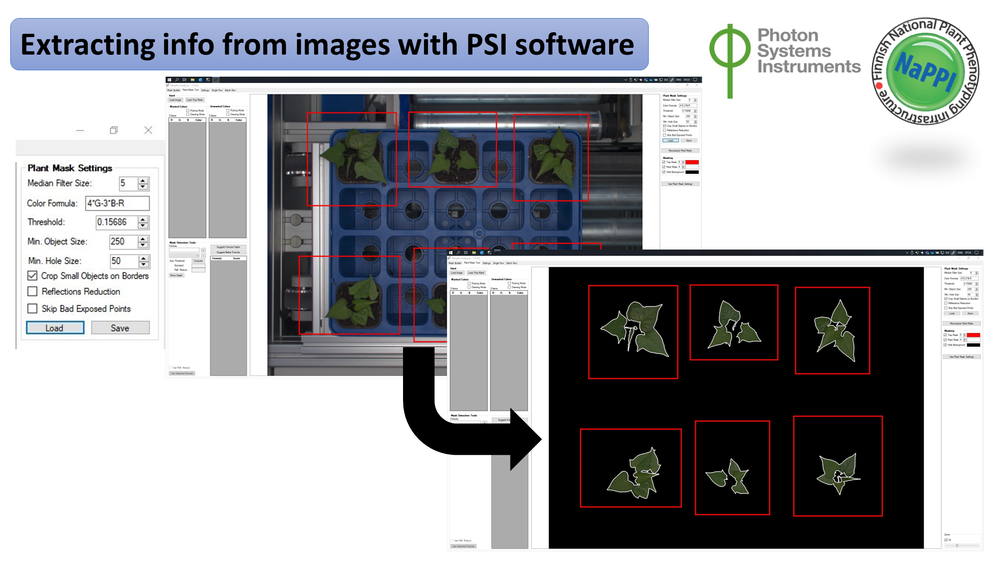

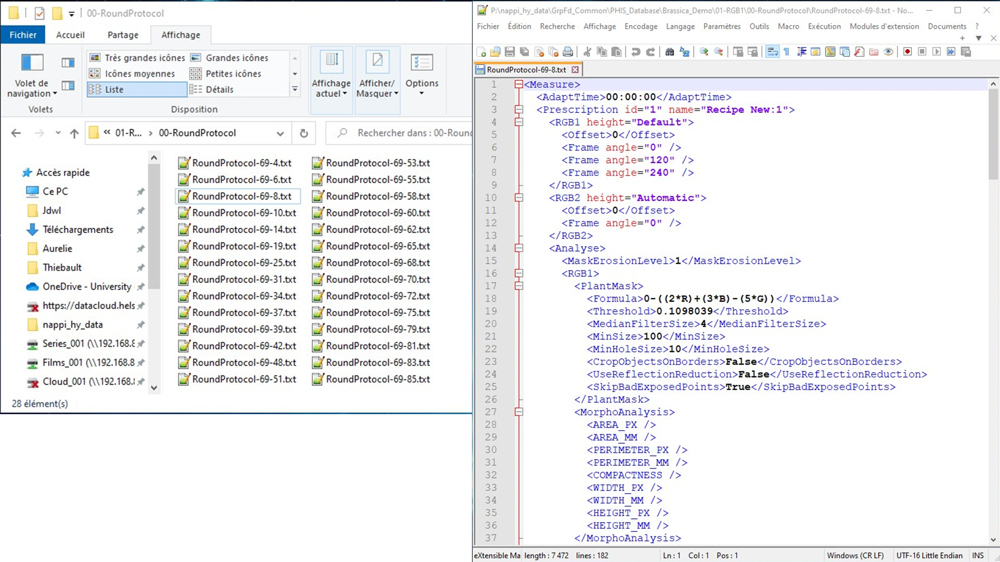

In [46]:
### Get RoundProtocol Infos #######################################################################
Round_files = []
for (root, dirs, files) in os.walk(wd_rgb1_roundinfo):
    for name in files:
        Round_files.append(os.path.join(root, name))

## Link RoundProtocol wd with Experiment and Round Numbers ########################################
Exp_Rd_Dict = {}
for wd_round in Round_files:
    Exp_Rd_temp = os.path.basename(wd_round)
    Exp_Rd = str.replace(Exp_Rd_temp, ".txt", "")
    Exp_Rd_ls = Exp_Rd.split("-")
    Exp_Rd_Dict.update({wd_round: {"Experiment": Exp_Rd_ls[1], "Round": Exp_Rd_ls[2]}})

## Create Dictionary for all parameters ###########################################################
PlantMask = {}
CamPos = {}

## Transform RoundProtocol to acceptable xml ######################################################
for key, value in Exp_Rd_Dict.items():
    with open(key) as file:
        xml_like = file.read()
    file.close()
    xml_str = str.replace(xml_like, "\x00", "", -1)
    root = ET.fromstring(xml_str)
    del file, xml_like, xml_str

    ## Get PlantMask Info for all rounds ##########################################################
    PlantMask_rd={}
    for child in root.iter(PID):
        for subchild in child.iter("PlantMask"):
            for i in subchild.iter():
                PlantMask_rd.update({i.tag: i.text})
    if 'PlantMask' in PlantMask_rd:
        del PlantMask_rd['PlantMask']
    PlantMask.update({value["Round"]: PlantMask_rd})
    del child, subchild, i, PlantMask_rd

    ## Get Camera Position Info for all rounds ####################################################
    CamPos_rd = {}
    for child in root.iter(PID):
        CamPos_rd.update(child.attrib)
    for child in root.iter(PID):
        for subchild in child.iter("Offset"):
            CamPos_rd.update({subchild.tag: subchild.text})
    CamPos.update({value["Round"]: CamPos_rd})
    del child, subchild, CamPos_rd

print("PlantMask, Camera Position Info Listed")

PlantMask, Camera Position Info Listed


In [97]:
PlantMask['4']

{'Formula': '0-((2*R)+(3*B)-(5*G))',
 'Threshold': '0.1098039',
 'MedianFilterSize': '4',
 'MinSize': '100',
 'MinHoleSize': '10',
 'CropObjectsOnBorders': 'False',
 'UseReflectionReduction': 'False',
 'SkipBadExposedPoints': 'True'}

In [49]:
CamPos['4']

{'height': 'Default', 'Offset': '0'}

# Get or Create Scientific Objects

In [50]:
df_ScObj

,Tray ID,Plant ID,Geno,Germplasm
0,180806.Bra.37,BRA04_037,SemiDwarf,BC4F2_4003_SemiDwarf
1,180806.Bra.49,BRA04_049,WildType,BC4F2_4003_WildType
2,180806.Bra.67,BRA04_067,Dwarf,BC4F2_4003_Dwarf


In [52]:
# Get Scientific Objects Name&URI #################################################################
ScObj_Api = osC.ScientificObjectsApi(Py_Client)
ScObj_uri = {}
for index, row in tqdm(df_ScObj.iterrows(), desc="ScObj processing:"):
    ScObj_Src = ScObj_Api.search_scientific_objects(name=row["Plant ID"])["result"]
    if ScObj_Src:
        ScObj_uri.update({row["Plant ID"]: ScObj_Src[0].uri})
    else:
        Relations_ScObj=[]
        ## ObjectRealtionDTO for Germplasm ########################################################
        if Subtaxa_uri:
            relation_temp = osC.RDFObjectRelationDTO(
                _property="vocabulary:hasGermplasm",
                value=Subtaxa_uri.get(row["Germplasm"]))
            Relations_ScObj.append(relation_temp)
            del relation_temp
        ## ObjectRealtionDTO for Factors ##########################################################
        if Factors_Levels_uri:
            Factors_temp = {"Factors": row["Plant Info"].split("_")}
            for factor in Factors_temp["Factors"]:
                relation_temp = osC.RDFObjectRelationDTO(
                    _property="vocabulary:hasFactorLevel",
                    value=Factors_Levels_uri.get(factor))
                Relations_ScObj.append(relation_temp)
                del relation_temp
        Relations = Relations_Gen + Relations_ScObj
        ## Creation of Scientific Object ##########################################################
        body = osC.ScientificObjectCreationDTO(name=row["Plant ID"],
                                               rdf_type=rdf_type,
                                               relations=Relations,
                                               experiment=uri_exp)
        print(body)
        ScObj_Api.create_scientific_object(body, )
        ## Get New Scientific Object Name&URI #####################################################
        ScObj_Src = ScObj_Api.search_scientific_objects(name=row["Plant ID"])["result"]
        ScObj_uri.update({row["Plant ID"]: ScObj_Src[0].uri})

print('Done')

ScObj processing:: 3it [00:01,  2.65it/s]

Done


# Listing&Importing Images

## List RGB1 Images

In [54]:
wd_img = os.path.join(wd_rgb1, '02-Images')

ls_files = []
for (root, dirs, files) in os.walk(wd_img):
    for filename in files:
        if filename.endswith(".png"):
            ls_files.append(os.path.join(root, filename))


ls_fec = [x for x in ls_files if "-FishEyeCorrected" in x]
ls_fem = [x for x in ls_files if "-FishEyeMasked" in x ]

print('FEC Img path: {}\nFEM path: {}'. format(ls_fec[0], ls_fem[0]))

FEC Img path: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\Brassica_Demo\01-RGB1\02-Images\FEC\BRA04_037\69-10-180806.Bra.37-RGB1-000-FishEyeCorrected.png
FEM path: P:\h572\nappi_hy_data\GrpFd_Common\PHIS_Database\Brassica_Demo\01-RGB1\02-Images\FEM\BRA04_037\69-10-180806.Bra.37-RGB1-000-FishEyeMasked.png


## Get or Create FEC Provenance

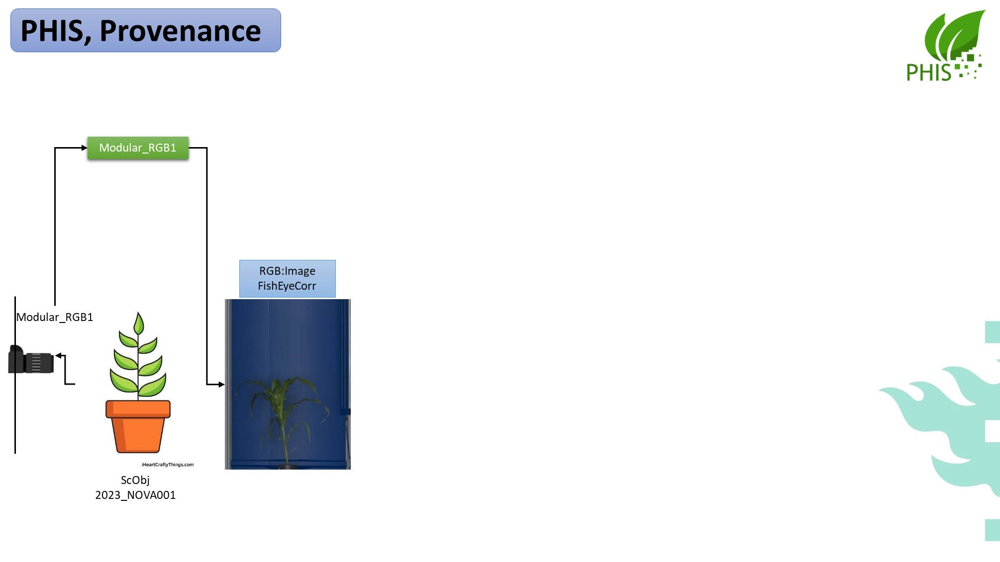

In [55]:
# Get Fish-Eye Corrected Provenance ###############################################################
Dat_Api = osC.DataApi(Py_Client)

prov = str("{}_{}_FishEyeCorrectedImages".format(Facility, PID))

Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    Prov_FishEyeCorr_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI: {}".format(prov,Prov_Src[0].uri))
else:
    description = "Fish-Eye Corrected images acquired by Modular Side View camera (RGB1)"

    prov_activity = [osC.ActivityCreationDTO(rdf_type="vocabulary:ImageAcquisition")]

    prov_agent = [
        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_plantscreen",
                       rdf_type="vocabulary:Actuator"),

        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_linescan_rgb1",
                                 rdf_type="vocabulary:RGBCamera",
                                 settings={})]

    body = osC.ProvenanceCreationDTO(name=prov,
                                     description=description,
                                     prov_agent=prov_agent,
                                     prov_activity=prov_activity)

    Api_Resp = Dat_Api.create_provenance(body=body, )
    print("Provenance Created: {}".format(str(Api_Resp["metadata"]["datafiles"])))
    Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
    Prov_FishEyeCorr_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI Created: {}".format(prov,  Prov_Src[0].uri))
    del description, prov_activity, prov_agent, body, Api_Resp
del prov, Dat_Api, Prov_Src

Modular_RGB1_FishEyeCorrectedImages URI: phis-egi-demo:id/provenance/modular_rgb1_fisheyecorrectedimages


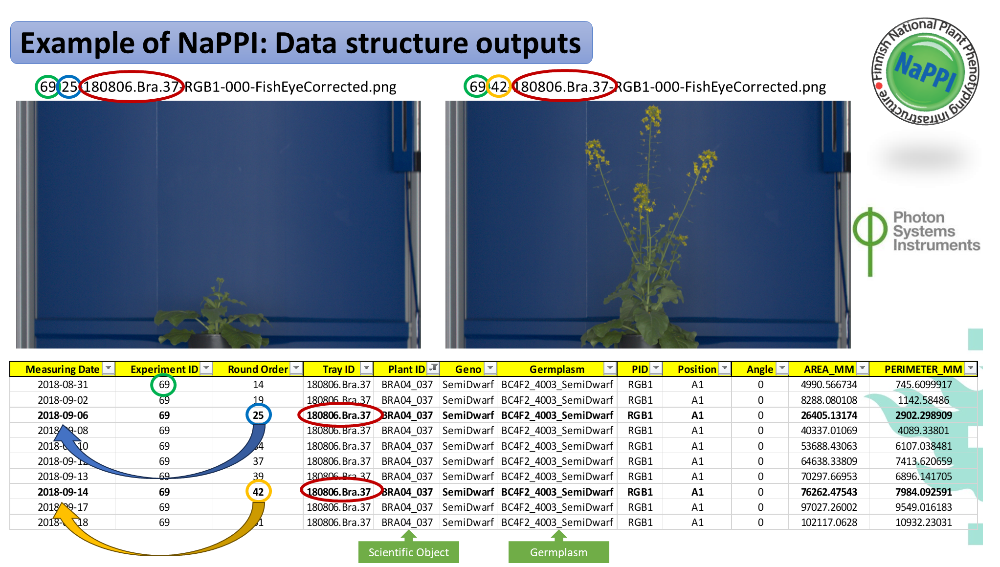

In [56]:
#%% Get FishEyeCorrected Info in Dict #######################################################################################
Corr_Name_All=[]
for corr in ls_fec:
    Corr_temp = os.path.basename(corr)
    Corr_temp = str.replace(Corr_temp, ".png", "")
    Corr_ls = Corr_temp.split("-")
    Corr_Dict= {"Path": corr,
                "Experiment ID": Corr_ls[0],
                "Round Order": Corr_ls[1],
                "Date": str(Date_Round[int(Corr_ls[1])]),
                "Tray ID": Corr_ls[2],
                "PID": Corr_ls[3],
                'Angle': Corr_ls[4],
                "ImgType": Corr_ls[5]}
    Corr_Name_All.append(Corr_Dict)
del Corr_temp, Corr_ls, corr, Corr_Dict

display(Corr_Name_All[0])

{'Path': 'P:\\h572\\nappi_hy_data\\GrpFd_Common\\PHIS_Database\\Brassica_Demo\\01-RGB1\\02-Images\\FEC\\BRA04_037\\69-10-180806.Bra.37-RGB1-000-FishEyeCorrected.png',
 'Experiment ID': '69',
 'Round Order': '10',
 'Date': '2018-08-27',
 'Tray ID': '180806.Bra.37',
 'PID': 'RGB1',
 'Angle': '000',
 'ImgType': 'FishEyeCorrected'}

## Import RGB1 FEC Images

In [58]:
#%% Filter out existing FEC #######################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[Prov_FishEyeCorr_uri["uri"]], page_size=0)["result"]
Corr_Name_Com=[]
for i in Corr_Name_All:
    for elts in Dat_Src:
        if ScObj_uri[Tray_Plant[i["Tray ID"]]] == elts.target and i["Date"] == elts._date:
            Corr_Name_Com.append(i)
        del elts
del i
print("{} images over {} already exit on the database".format(len(Corr_Name_Com), len(Corr_Name_All)))

#%% Exclude existing one from the Dict ##############################################################
Corr_Name=[]
for i in Corr_Name_All:
        if i not in Corr_Name_Com:
            Corr_Name.append(i)
del i, Corr_Name_All, Corr_Name_Com, Dat_Src

0 images over 84 already exit on the database


In [61]:
#%% Import FishEyeCorrected Images ################################################################
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])

timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

Dat_Api = osC.DataApi(Py_Client)
for img in tqdm(Corr_Name):
    description={"rdf_type":"vocabulary:RGBImage", #<- Here a DTO object was orginially proposed
                 "date":img["Date"],
                 "target":ScObj_uri[Tray_Plant[img["Tray ID"]]],
                 "provenance": {"uri": Prov_FishEyeCorr_uri["uri"],
                                "settings": {"Camera Height": CamPos[img["Round Order"]]["height"],
                                             "Offset": CamPos[img["Round Order"]]["Offset"]},
                               "experiments": [uri_exp]
                               }
                }
    Dat_Api.post_data_file(description=json.dumps(description), file=img["Path"], ) #<- DTO object was replaced by json.dumps()
    del img, description

    if datetime.datetime.now() > timelimit:
        Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                          password=login["Password"],
                                          host=login["Host"])
        Dat_Api = osC.DataApi(Py_Client)
        timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)
        #print(Py_Client.default_headers['Authorization'])

print ('Done')

100%|██████████████████████████████████████████████████████████████████████████████████| 84/84 [01:23<00:00,  1.00it/s]

Done


In [62]:
#%% Link FEC URI to FEM ###########################################################################
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[Prov_FishEyeCorr_uri["uri"]], page_size=0)["result"]
Corr_uri=[]
for elts in Dat_Src:
    for k, v in ScObj_uri.items():
        if v == elts.target:
            target=k

    Corr_uri.append({'Type': 'FEC',
                     "Target": target,
                     "Tray ID": [key for key, value in Tray_Plant.items() if value == target][0],
                     "Date": elts._date,
                     "uri": elts.uri})
del elts, k, v, Dat_Src, Dat_Api

In [63]:
Corr_uri[0]

{'Type': 'FEC',
 'Target': 'BRA04_037',
 'Tray ID': '180806.Bra.37',
 'Date': '2018-10-02',
 'uri': 'phis-egi-demo:id/file/1538438400.5b838f22409a5f85d8ce37676a00093d'}

## Get or Create FEM Provenance

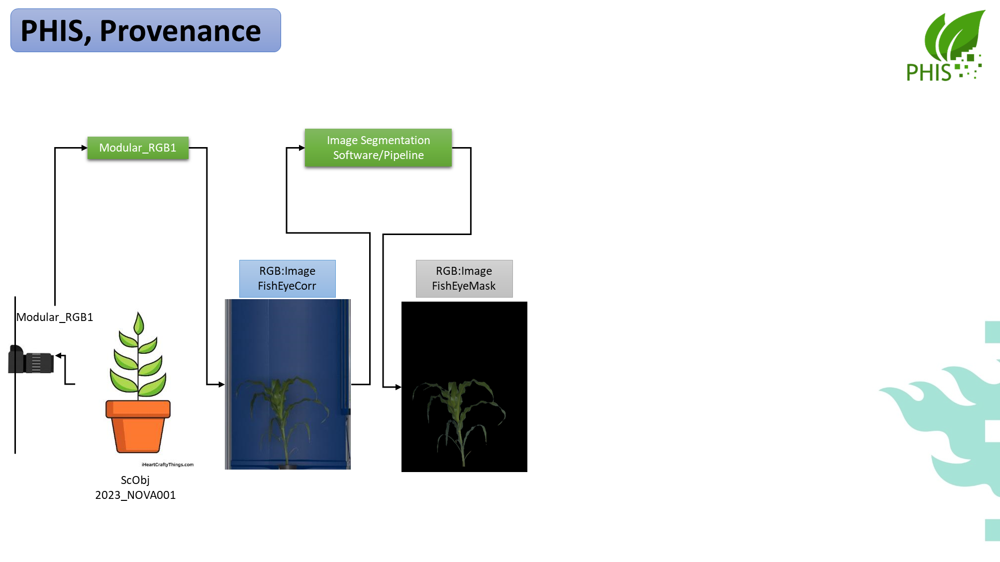

In [102]:
# Get Fish-Eye Masked Provenance ##################################################################
Dat_Api = osC.DataApi(Py_Client)

prov = str("{}_{}_FishEyeMaskedImages".format(Facility, PID))

Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    Prov_FishEyeMask_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI: {}".format(prov, Prov_Src[0].uri))
else:
    description = "Fish-Eye Masked images generated by PSI DataAnalyser from Modular Side View (RGB1) images"

    prov_activity = [osC.ActivityCreationDTO(rdf_type="vocabulary:ImageAnalysis")]

    prov_agent = [
        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_plantscreen",
                       rdf_type="vocabulary:Actuator"),

        osC.AgentModel(uri="phis-egi-demo:id/device/plantscreen_data_analyser",
                       rdf_type="vocabulary:Software"),

        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_linescan_rgb1",
                                 rdf_type="vocabulary:RGBCamera",
                                 settings={})
        ]

    body = osC.ProvenanceCreationDTO(name=prov,
                                     description=description,
                                     prov_agent=prov_agent,
                                     prov_activity=prov_activity)

    Api_Resp = Dat_Api.create_provenance(body=body, )
    print("Provenance Created: {}".format(str(Api_Resp["metadata"]["datafiles"])))
    Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
    Prov_FishEyeMask_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI Created: {}".format(prov, Prov_Src[0].uri))
    del description, prov_activity, prov_agent, body, Api_Resp
del prov, Dat_Api, Prov_Src

Modular_RGB1_FishEyeMaskedImages URI: phis-egi-demo:id/provenance/modular_rgb1_fisheyemaskedimages


## Import RGB1 FEM Images

In [103]:
#%% Get FishEyeMasked Info in Dict ##########################################################################################
Mask_Name_All=[]
for mask in ls_fem:
    Mask_temp = os.path.basename(mask)
    Mask_temp = str.replace(Mask_temp, ".png", "")
    Mask_ls = Mask_temp.split("-")
    Mask_Dict= {"Path": mask,
                "Experiment ID": Mask_ls[0],
                "Round Order": Mask_ls[1],
                "Date": str(Date_Round[int(Mask_ls[1])]),
                "Tray ID": Mask_ls[2],
                "PID": Mask_ls[3],
                'Angle': Mask_ls[4],
                "ImgType": Mask_ls[5]}
    Mask_Name_All.append(Mask_Dict)
#del Mask_temp, Mask_ls, mask, Mask_Dict

for elts in Mask_Name_All:
    for item in Corr_uri:
        if item["Target"]==Tray_Plant[elts["Tray ID"]] and item["Date"]==elts["Date"]:
            elts.update({"Prov_Used": item["uri"]})
            
display(Mask_Name_All[0])

{'Path': 'P:\\h572\\nappi_hy_data\\GrpFd_Common\\PHIS_Database\\Brassica_Demo\\01-RGB1\\02-Images\\FEM\\BRA04_037\\69-10-180806.Bra.37-RGB1-000-FishEyeMasked.png',
 'Experiment ID': '69',
 'Round Order': '10',
 'Date': '2018-08-27',
 'Tray ID': '180806.Bra.37',
 'PID': 'RGB1',
 'Angle': '000',
 'ImgType': 'FishEyeMasked',
 'Prov_Used': 'phis-egi-demo:id/file/1535328000.5b838f22409a5f85d8ce37676a00093d'}

In [105]:
#%% Filter out existing images ####################################################################
Dat_Api = osC.DataApi(Py_Client)
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[Prov_FishEyeMask_uri["uri"]], page_size=0)["result"]
Mask_Name_Com=[]
for i in Mask_Name_All:
    for elts in Dat_Src:
        if ScObj_uri[Tray_Plant[i["Tray ID"]]] == elts.target  and i["Date"] == elts._date:
            Mask_Name_Com.append(i)
            #print("ScObj {} with angle {} at date {} already  exist".format(ScObj_uri[i["Name"]], i["Angle"], i["Date"]))
print("{} images over {} already exit on the database".format(len(Mask_Name_Com), len(Mask_Name_All)))
del i
Mask_Name=[]
for i in Mask_Name_All:
        if i not in Mask_Name_Com:
            Mask_Name.append(i)

84 images over 84 already exit on the database


In [67]:
#%% Import FishEyeMasked Images ###################################################################
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

Dat_Api = osC.DataApi(Py_Client)
for img in tqdm(Mask_Name):
    Setting_Dict={}
    Setting_Dict.update(PlantMask[str(img["Round Order"])])
    description={"rdf_type":"vocabulary:RGBImage",
                 "date":img["Date"],
                 "target":ScObj_uri[Tray_Plant[img["Tray ID"]]],
                 "provenance": {"uri": Prov_FishEyeMask_uri["uri"],
                                "prov_used": [{"uri": img["Prov_Used"],
                                               "rdf_type":"vocabulary:RGBImage"}],
                                "settings": Setting_Dict,
                                "experiments": [uri_exp]
                               }
                }
    Dat_Api.post_data_file(description=json.dumps(description), file=img["Path"], )
    del img, description

    if datetime.datetime.now() > timelimit:
        Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                          password=login["Password"],
                                          host=login["Host"])
        Dat_Api = osC.DataApi(Py_Client)
        timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)
        #print(Py_Client.default_headers['Authorization'])

print ('Done')

100%|██████████████████████████████████████████████████████████████████████████████████| 84/84 [00:11<00:00,  7.46it/s]

Done


In [106]:
#%% Link FEM URI to Target ########################################################################
Dat_Src = Dat_Api.get_data_file_descriptions_by_search(provenances=[Prov_FishEyeMask_uri["uri"]], page_size=0)["result"]

Mask_uri=[]
for elts in Dat_Src:
    for k, v in ScObj_uri.items():
        if v == elts.target:
            target=k
    Mask_uri.append({'Type': 'FEM',
                     "Target": target,
                     "Tray ID": [key for key, value in Tray_Plant.items() if value == target][0],
                     "Date": elts._date,
                     "uri": elts.uri})

In [77]:
Mask_uri[0]

{'Type': 'FEM',
 'Target': 'BRA04_037',
 'Tray ID': '180806.Bra.37',
 'Date': '2018-10-02',
 'uri': 'phis-egi-demo:id/file/1538438400.306bffc85aac3cee655612d24f7f5410'}

# Importing Morphological Data

## Get or Create Morpho Data Provenance

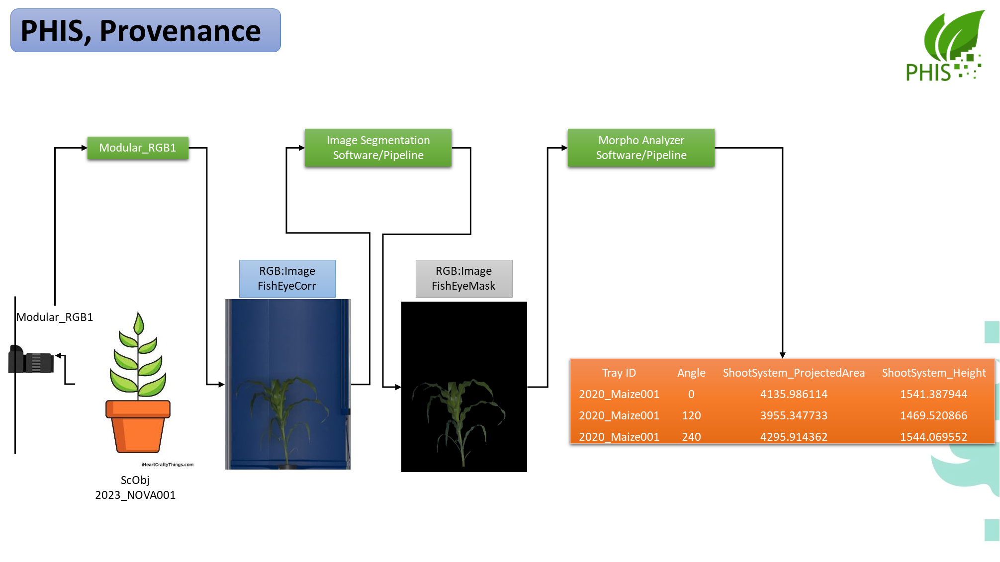

In [78]:
# Get MorphoParameters Provenance #################################################################
Dat_Api = osC.DataApi(Py_Client)

prov = str("{}_{}_MorphoParameters".format(Facility, PID))

Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
if Prov_Src:
    Prov_Morpho_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI: {}".format(prov, Prov_Src[0].uri))
else:
    description = "Morphological parameters computed by PSI DataAnalyser from Modular Side View (RGB1) images"
    prov_activity = [osC.ActivityCreationDTO(rdf_type="vocabulary:ImageAnalysis")]
    prov_agent = [

        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_plantscreen",
                       rdf_type="vocabulary:Actuator"),

        osC.AgentModel(uri="http://phis.egi-demo.eu/id/device/modular_linescan_rgb1",
                       rdf_type="vocabulary:RGBCamera",
                       settings={}),

        osC.AgentModel(uri="phis-egi-demo:id/device/plantscreen_data_analyser",
                       rdf_type="vocabulary:Software")
        ]

    body = osC.ProvenanceCreationDTO(name=prov,
                                     description=description,
                                     prov_agent=prov_agent,
                                     prov_activity=prov_activity)

    Api_Resp = Dat_Api.create_provenance(body=body, )
    print("Provenance Created: {}".format(str(Api_Resp["metadata"]["datafiles"])))
    Prov_Src = Dat_Api.search_provenance(name=prov,)["result"]
    Prov_Morpho_uri = {"name": prov, "uri": Prov_Src[0].uri}
    print("{} URI Created: {}".format(prov, Prov_Src[0].uri))
    del description, prov_activity, prov_agent, body, Api_Resp
del prov, Dat_Api, Prov_Src

Modular_RGB1_MorphoParameters URI: phis-egi-demo:id/provenance/modular_rgb1_morphoparameters


## Get link between Columns Names and Variables

In [79]:
wd_yaml=os.path.join(wd_exp, '.yaml')
with open (os.path.join(wd_yaml, 'Morpho_Info.yaml'), 'r') as stream:
    Morpho_Info=yaml.safe_load(stream)
del(wd_yaml)

display(Morpho_Info)

{'AREA_MM': 'Plant_Area',
 'PERIMETER_MM': 'Plant_Perimeter',
 'HEIGHT_MM': 'Plant_Height'}

## Import Data

In [80]:
Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                  password=login["Password"],
                                  host=login["Host"])
timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

#%% Data Import ###################################################################################
Dat_Api = osC.DataApi(Py_Client)
Var_Api = osC.VariablesApi(Py_Client)

Prov_Was_Associated_With=osC.ProvEntityModel(uri="phis-egi-demo:id/device/plantscreen_data_analyser",
                                             rdf_type="vocabulary:Software")

for key, value in tqdm(Morpho_Info.items()):
    Var_Src = Var_Api.search_variables(name=value)["result"]
    ## Get or Create Numerical data ###############################################################
    pas=1000
    count=0
    for slc in range(0, len(df_rgb1), pas):
        df_Slice = df_rgb1.iloc[slc : slc + pas]
        bodies=[]
        count=count+1
        for index, row in df_Slice.iterrows():
            Prov_Used=None
            for item in Mask_uri:
                if item["Target"]==row["Plant ID"] and item["Date"]==str(row['Measuring Date']):
                    Prov_Used=osC.ProvEntityModel(uri=item["uri"], rdf_type="vocabulary:RGBImage")
            body = osC.DataCreationDTO(_date = str(row['Measuring Date']),
                                       target = ScObj_uri[row["Plant ID"]],
                                       variable = Var_Src[0].uri,
                                       value = row[key],
                                       provenance = osC.DataProvenanceModel(
                                           uri = Prov_Morpho_uri["uri"],
                                           prov_used = [Prov_Used],
                                           prov_was_associated_with = [Prov_Was_Associated_With],
                                           experiments = [uri_exp]))
            bodies.append(body)
            if datetime.datetime.now() > timelimit:
                Py_Client.connect_to_opensilex_ws(identifier=login["Identifier"],
                                                  password=login["Password"],
                                                  host=login["Host"])
                Dat_Api = osC.DataApi(Py_Client)
                timelimit = datetime.datetime.now()+datetime.timedelta(minutes=30)

        Dat_Api.add_list_data(body=bodies,)
print('Import Over')

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.12s/it]

Import Over


In [107]:
bodies[0]

{'_date': '2018-08-21',
 'confidence': None,
 'metadata': None,
 'provenance': {'experiments': ['phis-egi-demo:id/experiment/brassica_demo'],
                'prov_used': [{'rdf_type': 'vocabulary:RGBImage',
                               'uri': 'phis-egi-demo:id/file/1534809600.d149af133f3389e9912dfc0aa4f0853f'}],
                'prov_was_associated_with': [{'rdf_type': 'vocabulary:Software',
                                              'uri': 'phis-egi-demo:id/device/plantscreen_data_analyser'}],
                'settings': None,
                'uri': 'phis-egi-demo:id/provenance/modular_rgb1_morphoparameters'},
 'raw_data': None,
 'target': 'phis-egi-demo:id/scientific-object/so-bra04_037',
 'timezone': None,
 'uri': None,
 'value': 0.0,
 'variable': 'http://phis.egi-demo.eu/id/variable/plant_height_imageprocessing_millimetre'}